## Procesamiento de Datos Experimentales para Análisis

Código diseñado para leer y organizar datos experimentales de archivos de texto en DataFrames de Pandas. Incluye:
- **Funciones para extracción de datos**: `parse_header()` para metadatos y `extract_data()` para convertir datos en DataFrame.
- **Estructuras de datos para organización**: Uso de diccionarios para agrupar datos por canales y pulsos, facilitando el acceso y manejo.
- **Procesamiento y acceso automatizado**: Iteración sobre archivos de un directorio, extracción y almacenamiento estructurado, con ejemplo de acceso a los datos.


In [3]:
import os
import re
import pandas as pd

# Function to parse the header and extract number of points
def parse_header(file_lines):
    for line in file_lines:
        if "SegmentSize" in line:
            return int(re.search(r"SegmentSize (\d+)", line).group(1))
    return None

# Function to extract data from a file
def extract_data(filepath):
    with open(filepath, 'r') as file:
        lines = file.readlines()
        num_points = parse_header(lines)
        # Find the line where data starts
        start_idx = next(i for i, line in enumerate(lines) if "Time Ampl" in line) + 1
        data_lines = lines[start_idx:start_idx + num_points]
        data = [list(map(float, line.strip().split())) for line in data_lines]
        return pd.DataFrame(data, columns=['Time', 'Amplitude'])

# Path to the directory containing the files
directory_path = '/home/addles/SDR/SPILLS 1/mas datos/Run26May_PrimeraParte'

# Pattern to match files
pattern = re.compile(r"C(\d)s0123srd(\d+)\.txt")

# Dictionary to store data
data = {}

# Iterate over files in the directory
for filename in os.listdir(directory_path):
    match = pattern.match(filename)
    if match:
        channel, pulse = match.groups()
        filepath = os.path.join(directory_path, filename)
        df = extract_data(filepath)
        if channel not in data:
            data[channel] = {}
        data[channel][pulse] = df

# Example: Access data for channel 1, pulse 0001
print(data['1']['00001'])

              Time  Amplitude
0    -6.317200e-08   0.013333
1    -6.267200e-08   0.006667
2    -6.217200e-08   0.013333
3    -6.167200e-08   0.006667
4    -6.117200e-08   0.013333
...            ...        ...
997   4.353280e-07   0.000000
998   4.358280e-07   0.006667
999   4.363280e-07   0.006667
1000  4.368280e-07   0.006667
1001  4.373280e-07   0.006667

[1002 rows x 2 columns]


## Visualización de Pulso

Este código permite la visualización gráfica de pulsos experimentales específicos a partir de datos estructurados en un DataFrame de Pandas. Características principales:
- **Selección de canal y pulso**: Variables `selected_channel` y `selected_pulse` para definir el canal y el número de pulso que se desea visualizar.
- **Función de visualización**: `select_and_plot_pulse` verifica la disponibilidad del canal y pulso, extrae los datos correspondientes y los grafica.
- **Procesamiento de la visualización**: Se emplea Matplotlib para trazar un gráfico de los datos de amplitud versus tiempo, proporcionando una representación visual clara del pulso seleccionado.


              Time  Amplitude
0    -6.317200e-08   0.006667
1    -6.267200e-08   0.006667
2    -6.217200e-08   0.006667
3    -6.167200e-08   0.013333
4    -6.117200e-08   0.006667
...            ...        ...
997   4.353280e-07   0.006667
998   4.358280e-07   0.006667
999   4.363280e-07   0.006667
1000  4.368280e-07   0.006667
1001  4.373280e-07   0.006667

[1002 rows x 2 columns]


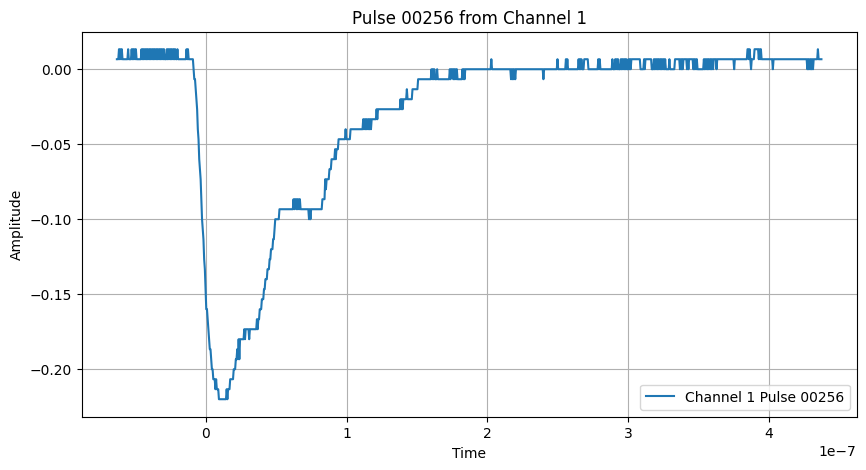

In [4]:
import matplotlib.pyplot as plt

# Definir las variables para el canal y el número de pulso
selected_channel = '1'  # Cambiar el número de canal según la necesidad
selected_pulse = '00256'  # Cambiar el número de pulso según la necesidad

# Función para seleccionar e imprimir un pulso específico
def select_and_plot_pulse(data, channel, pulse):
    # Verificar si el canal y el pulso están disponibles en el diccionario
    if channel not in data:
        print(f"No data available for channel {channel}.")
        return
    if pulse not in data[channel]:
        print(f"No pulse number {pulse} available in channel {channel}.")
        return

    # Obtener el DataFrame para el pulso seleccionado
    pulse_data = data[channel][pulse]
    
    # Imprimir el DataFrame
    print(pulse_data)
    
    # Trazar el pulso
    plt.figure(figsize=(10, 5))
    plt.plot(pulse_data['Time'], pulse_data['Amplitude'], label=f"Channel {channel} Pulse {pulse}")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.title(f"Pulse {pulse} from Channel {channel}")
    plt.legend()
    plt.grid(True)
    plt.show()

# Llamar a la función con las variables definidas
select_and_plot_pulse(data, selected_channel, selected_pulse)

## Gráfico de Todos los Pulsos por Canal

Este fragmento de código genera un gráfico que compila todos los pulsos disponibles de todos los canales en un solo visual. Utiliza Matplotlib para la visualización eficaz de datos multidimensionales. Detalles del proceso incluyen:
- **Configuración inicial de la figura**: Establece el tamaño del gráfico y obtiene el eje actual.
- **Iteración sobre los datos**: Recorre cada canal y cada pulso dentro del canal, trazando los datos de amplitud en función del tiempo.
- **Personalización del gráfico**: Configura títulos y etiquetas para los ejes, y opcionalmente puede incluir una leyenda para diferenciar entre canales.
- **Visualización**: Muestra el gráfico resultante, ofreciendo una vista integral de todos los pulsos registrados.


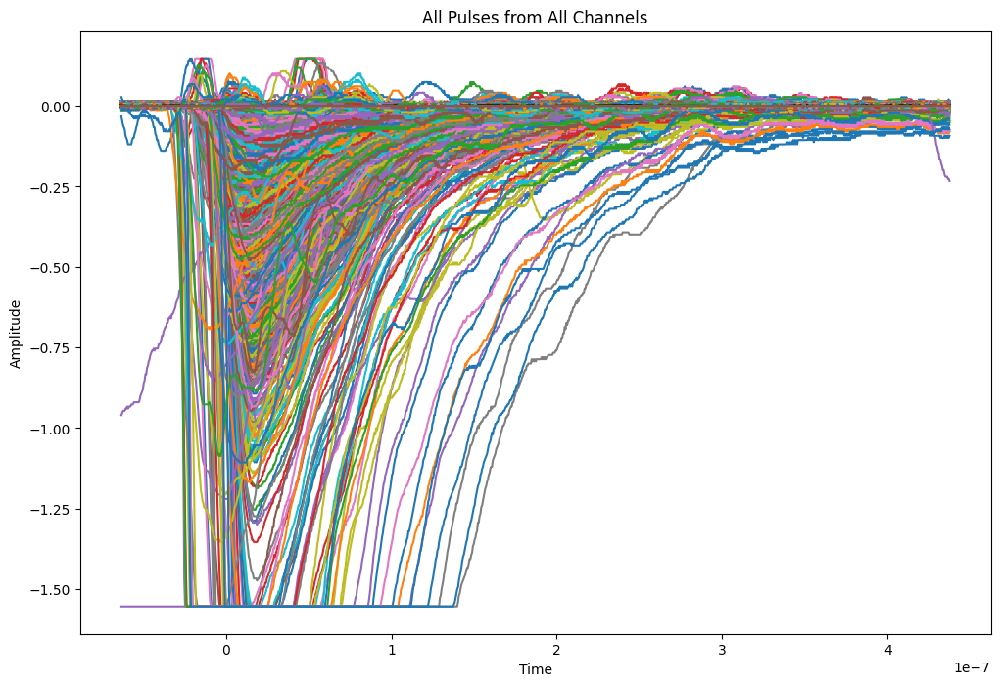

In [5]:
# Crear una figura y un eje para los gráficos
plt.figure(figsize=(12, 8))
ax = plt.gca()  # Obtener el eje actual

# Iterar sobre cada canal en los datos
for channel, pulses in data.items():
    # Iterar sobre cada pulso en el canal
    for pulse_id, df in pulses.items():
        # Trazar los datos
        ax.plot(df['Time'], df['Amplitude'])

# Configurar las etiquetas y títulos del gráfico
ax.set_title('All Pulses from All Channels')
ax.set_xlabel('Time')
ax.set_ylabel('Amplitude')
  # Mostrar la leyenda

# Mostrar el gráfico
plt.show()

## Filtrado y Visualización de Pulsos Válidos

Este código realiza el filtrado y la visualización de pulsos que no están saturados, según un umbral definido, y traza los pulsos válidos para todos los canales. Aspectos clave del proceso incluyen:

- **Establecimiento del umbral de saturación**: Define un umbral (Tsatur = -1.5) para identificar pulsos saturados y eliminarlos del análisis.
- **Creación de estructuras de datos para los filtrados**: Utiliza un diccionario para almacenar los datos de pulsos que pasan el criterio de filtrado.
- **Iteración y filtrado de datos**: Recorre todos los canales y pulsos, verificando la condición de amplitud para determinar si el pulso está saturado. Los pulsos que cumplen con el criterio son almacenados y trazados.
- **Visualización de resultados**: Muestra un gráfico que representa solo los pulsos que no están afectados por la saturación, ofreciendo una visión clara de los datos válidos.


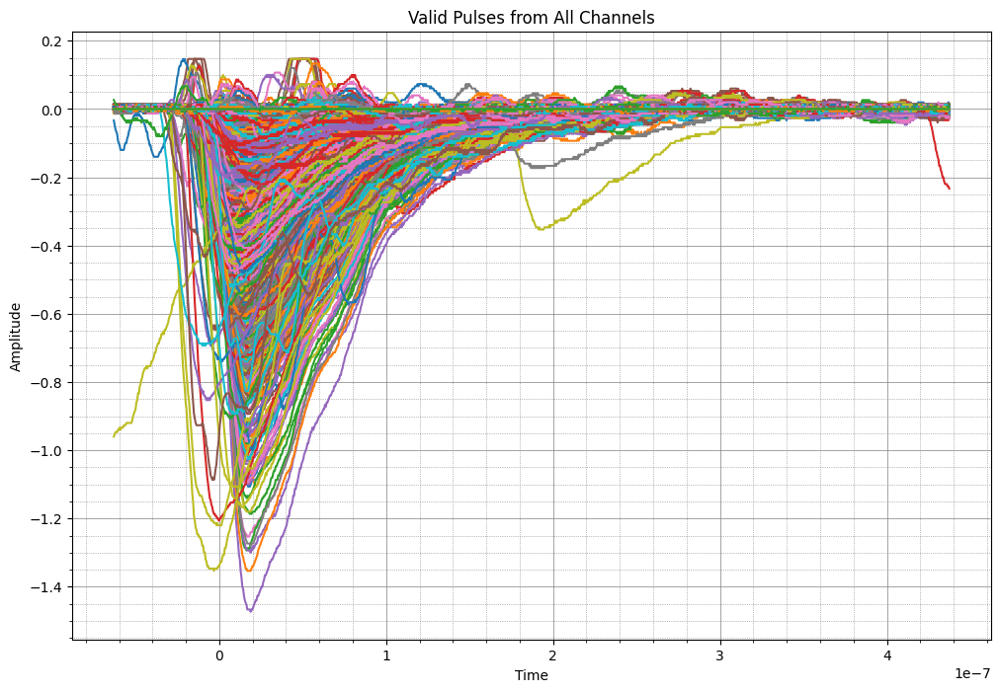

In [6]:
Tsatur= -1.5 #umbral para eliminar pulsos saturados

# Crear una figura y un eje para los gráficos
plt.figure(figsize=(12, 8))
ax = plt.gca()  # Obtener el eje actual

# Diccionario para almacenar los datos filtrados
filtered_data = {}

# Iterar sobre cada canal en los datos
for channel, pulses in data.items():
    # Preparar un diccionario para los pulsos filtrados de cada canal
    filtered_data[channel] = {}
    # Iterar sobre cada pulso en el canal
    for pulse_id, df in pulses.items():
        # Verificar si algun valor de amplitud en el DataFrame cae por debajo de -1.5
        if not (df['Amplitude'] < -1.5).any():
            # Guardar los datos que pasan el filtro en el nuevo diccionario
            filtered_data[channel][pulse_id] = df
            # Trazar los datos que pasan el filtro
            ax.plot(df['Time'], df['Amplitude'])

# Configurar las etiquetas y títulos del gráfico
ax.set_title('Valid Pulses from All Channels')
ax.set_xlabel('Time')
ax.set_ylabel('Amplitude')

# Configurar la grilla
ax.grid(True, which='both', linestyle='-', linewidth='0.5', color='gray')
ax.minorticks_on()  # Activar las marcas menores
ax.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')



# Mostrar el gráfico
plt.show()




## Visualización por Canal de Pulsos Filtrados

Este código crea subplots para cada canal en un conjunto de datos filtrado, graficando los pulsos que cumplen con un criterio de validación. Se utilizan subplots individuales para cada canal, facilitando la comparación visual entre ellos. Cada subplot muestra la amplitud en función del tiempo, etiquetado con información relevante del canal. Esto permite una interpretación clara y directa de la variabilidad y características de los pulsos dentro de cada canal.


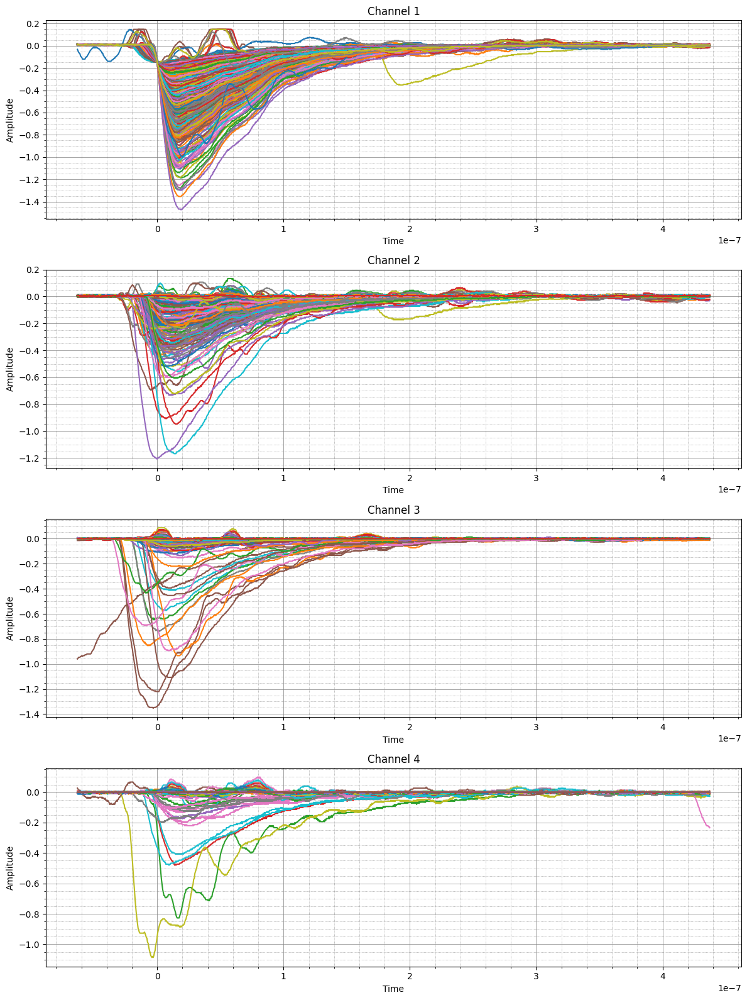

In [7]:


# Determinar cuántos canales únicos hay para configurar los subplots
num_channels = len(filtered_data.keys())
fig, axs = plt.subplots(num_channels, 1, figsize=(12, 4 * num_channels))  # Ajustar el tamaño según el número de canales

# Asegurarse de que axs sea iterable (en caso de que haya solo un canal)
if num_channels == 1:
    axs = [axs]

# Iterar sobre cada canal en los datos filtrados
for ax, (channel, pulses) in zip(axs, filtered_data.items()):
    # Iterar sobre cada pulso en el canal
    for pulse_id, df in pulses.items():
        # Trazar los datos
        ax.plot(df['Time'], df['Amplitude'])
        
    # Configurar las etiquetas y títulos del gráfico para cada subplot
    ax.set_title(f'Channel {channel}')
    ax.set_xlabel('Time')
    ax.set_ylabel('Amplitude')
    ax.grid(True, which='both', linestyle='-', linewidth='0.5', color='gray')
    ax.minorticks_on()
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
   

# Ajustar el layout para evitar superposiciones
plt.tight_layout()

# Mostrar el gráfico
plt.show()


## Corrección de Baseline y Comparación de Pulsos por Canal

Este código implementa un procedimiento para corregir el baseline de pulsos experimentales y visualizar comparativamente los datos originales y corregidos en subplots por canal. Proceso detallado:

- **Configuración de parámetros**: Define una ventana de tiempo para calcular la media del baseline y un umbral para descartar pulsos con un inicio problemático.
- **Preparación de subplots**: Crea un arreglo de subplots con dos columnas para cada canal, donde se visualizarán los pulsos antes y después de la corrección.
- **Creación de estructuras de datos para los pulsos corregidos**: Utiliza un diccionario para almacenar los pulsos ajustados de cada canal.
- **Iteración y corrección de datos por canal**: Recorre cada canal y sus pulsos, aplicando un ajuste de baseline cuando es adecuado y trazando los datos en los subplots correspondientes.
- **Configuración individual de cada subplot**: Cada subplot recibe configuraciones de título, etiquetas y grilla para mejorar la visualización y comparación.
- **Visualización de resultados**: Muestra los gráficos resultantes, proporcionando una comparación visual entre los datos originales y los corregidos, resaltando la efectividad del ajuste de baseline.


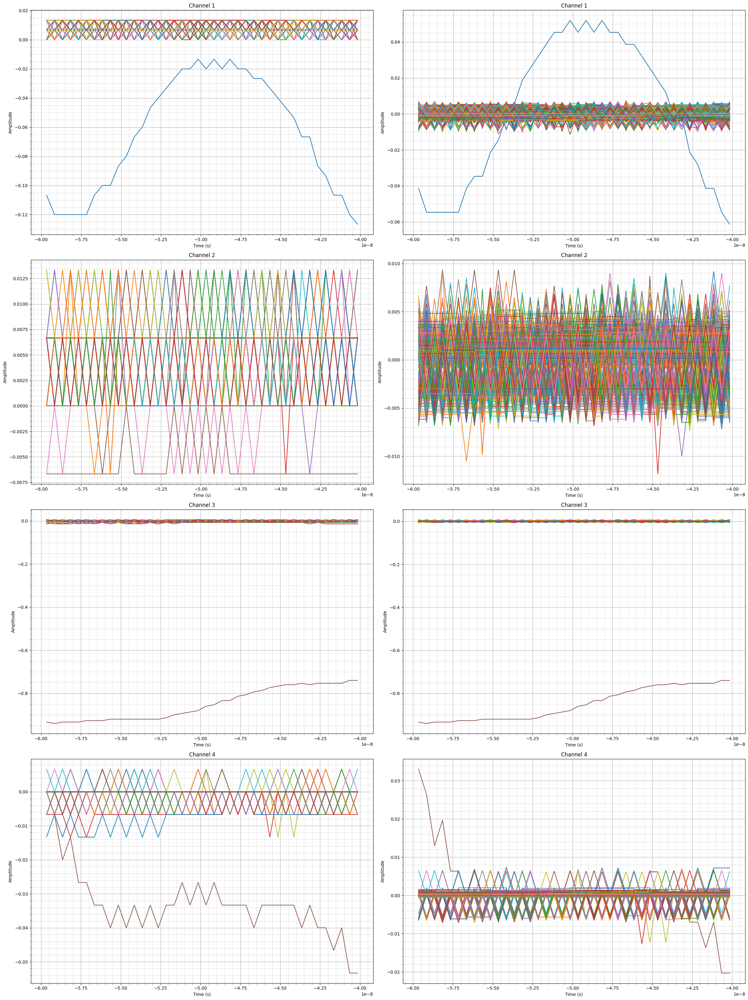

In [8]:


# Ventana de tiempo en la que se calculará la media
tiempo_inicial = -0.6e-7
ancho_ventana = 0.2e-7
tiempo_final = tiempo_inicial + ancho_ventana
#Umbral para descartar de la correccion pulsos que comienzan sin baseline
Usbaseline = -0.5

# Determinar cuántos canales únicos hay para configurar los subplots
num_channels = len(filtered_data.keys())
fig, axs = plt.subplots(num_channels, 2, figsize=(24, 8 * num_channels))  # Ajustar el tamaño según el número de canales

# Diccionario para almacenar los pulsos corregidos
corrected_data = {}

# Asegurarse de que axs sea iterable en todos los casos
if num_channels == 1:
    axs = axs.reshape(1, -1)  # Asegurarse de que axs tenga dos dimensiones

# Iterar sobre cada canal en los datos filtrados
for ax_row, (channel, pulses) in zip(axs, filtered_data.items()):
    # Preparar un diccionario para los pulsos corregidos de cada canal
    corrected_data[channel] = {}
    
    for pulse_id, df in pulses.items():
        # Encontrar índices dentro de la ventana de tiempo
        indices_ventana = (df['Time'] >= tiempo_inicial) & (df['Time'] <= tiempo_final)
        
        # Verificar el primer valor de amplitud
        if df['Amplitude'].iloc[0] < Usbaseline:
            # Si es menor que -0.5, usar el DataFrame original para ploteo y almacenamiento
            df_corregido = df.copy()  # No se hace corrección
        else:
            # Calcular la media en la ventana especificada
            media = df.loc[indices_ventana, 'Amplitude'].mean()
            
            # Restar la media de toda la amplitud para corregir el offset
            df_corregido = df.copy()
            df_corregido['Amplitude'] -= media
        
        # Guardar el pulso corregido en el diccionario
        corrected_data[channel][pulse_id] = df_corregido

        # Trazar los datos originales y corregidos solo en la ventana de tiempo
        ax_row[0].plot(df.loc[indices_ventana, 'Time'], df.loc[indices_ventana, 'Amplitude'])
        ax_row[1].plot(df_corregido.loc[indices_ventana, 'Time'], df_corregido.loc[indices_ventana, 'Amplitude'])

    

    # Configurar las etiquetas y títulos del gráfico para cada subplot
    for ax in ax_row:
        ax.set_title(f'Channel {channel}')
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Amplitude')
        ax.grid(True, which='both', linestyle='-', linewidth='0.5', color='gray')
        ax.minorticks_on()
        ax.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
       

# Ajustar el layout para evitar superposiciones
plt.tight_layout()

# Mostrar el gráfico
plt.show()




## Visualización de Pulsos Corregidos por Offset

Este código grafica los pulsos después de haber sido corregidos para eliminar desviaciones de baseline, usando subplots para cada canal.


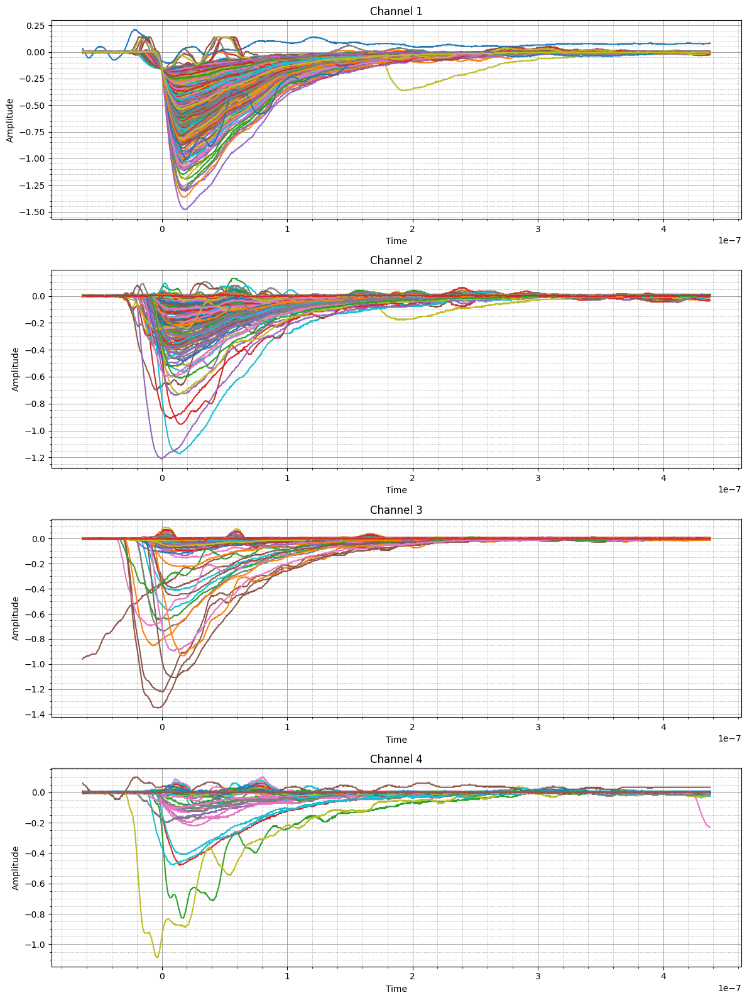

In [9]:

# Determinar cuántos canales únicos hay para configurar los subplots
num_channels = len(corrected_data.keys())
fig, axs = plt.subplots(num_channels, 1, figsize=(12, 4 * num_channels))  # Ajustar el tamaño según el número de canales

# Asegurarse de que axs sea iterable (en caso de que haya solo un canal)
if num_channels == 1:
    axs = [axs]

# Iterar sobre cada canal en los datos filtrados
for ax, (channel, pulses) in zip(axs, corrected_data.items()):
    # Iterar sobre cada pulso en el canal
    for pulse_id, df in pulses.items():
        # Trazar los datos
        ax.plot(df['Time'], df['Amplitude'])
        
    # Configurar las etiquetas y títulos del gráfico para cada subplot
    ax.set_title(f'Channel {channel}')
    ax.set_xlabel('Time')
    ax.set_ylabel('Amplitude')
    ax.grid(True, which='both', linestyle='-', linewidth='0.5', color='gray')
    ax.minorticks_on()
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')
   

# Ajustar el layout para evitar superposiciones
plt.tight_layout()

# Mostrar el gráfico
plt.show()


## Visualización de un Pulso Corregido Específico

Este fragmento de código está diseñado para graficar un pulso específico después de haber sido corregido para desviaciones de baseline. Detalles del proceso incluyen:

- **Selección de pulso y canal**: Se especifica el canal y el ID del pulso que se desea visualizar


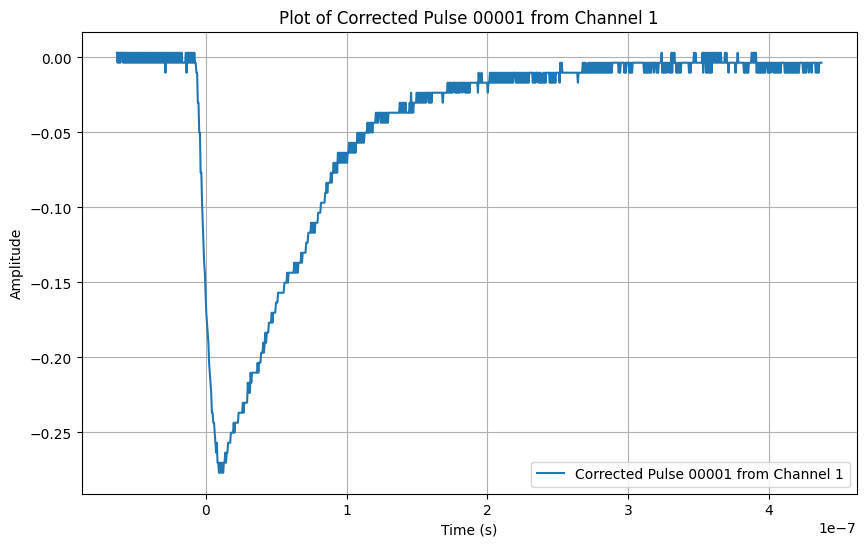

In [10]:
# Especificar el canal y el ID del pulso que deseas plotear
channel_to_plot = '1'  # Cambiar 'channel_X' por el número de canal real
pulse_id_to_plot = '00001'  # Cambiar 'pulse_id_Y' por el ID del pulso real

# Asegurarte de que el canal y el pulso existen en el diccionario de datos corregidos
if channel_to_plot in corrected_data and pulse_id_to_plot in corrected_data[channel_to_plot]:
    # Extraer el DataFrame del pulso seleccionado
    df_to_plot = corrected_data[channel_to_plot][pulse_id_to_plot]

    # Crear la figura y el eje
    plt.figure(figsize=(10, 6))
    plt.plot(df_to_plot['Time'], df_to_plot['Amplitude'], label=f'Corrected Pulse {pulse_id_to_plot} from Channel {channel_to_plot}')
    plt.title(f'Plot of Corrected Pulse {pulse_id_to_plot} from Channel {channel_to_plot}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.legend()
    plt.show()
else:
    print(f"Channel {channel_to_plot} or Pulse {pulse_id_to_plot} not found in corrected data.")


## Cálculo de Métricas de Pulsos

Este código proporciona una funcionalidad para calcular métricas específicas de pulsos eléctricos, como el tiempo de subida y el ancho del pulso, bajo condiciones definidas. Se detallan los siguientes procesos:

- **Funciones de cálculo**: Implementa dos funciones, `find_time_indices` para encontrar índices donde la señal cruza un porcentaje específico de su valor mínimo antes del pico, y `calculate_pulse_metrics` para calcular el tiempo de subida (de 10% a 90% del valor mínimo) y el ancho del pulso (en el 50% del valor mínimo).

- **Condición de umbral**: Solo se calculan las métricas para los pulsos cuya amplitud mínima es inferior a -0.009, lo que implica una señal significativa.

- **Almacenamiento de resultados**: Los resultados de las métricas de cada pulso en cada canal se almacenan en un diccionario, permitiendo fácil acceso y revisión de los datos.

- **Visualización de resultados**: El script imprime las métricas calculadas para cada pulso que cumple con la condición, y notifica cuando un pulso no supera el umbral requerido para el cálculo.

Este enfoque garantiza que solo los pulsos relevantes son analizados, optimizando los recursos computacionales y mejorando la relevancia de los resultados obtenidos.


In [11]:

def find_time_indices(values, percentage, peak_idx):
    """ Encuentra los índices donde la señal cruza cierto porcentaje de su mínimo antes del pico. """
    target_value = values.min() * percentage
    valid_range = values[:peak_idx]  # Considerar solo hasta el pico para el tiempo de subida
    indices = np.where(valid_range <= target_value)[0]
    return indices[0] if indices.size > 0 else None, indices[-1] if indices.size > 0 else None

def calculate_pulse_metrics(pulse_df):
    """ Calcula el tiempo de subida y el ancho del pulso solo si el pulso supera el umbral de -0.009. """
    # Amplitudes negativas: buscamos valores mínimos
    min_amplitude = pulse_df['Amplitude'].min()
    min_idx = pulse_df['Amplitude'].idxmin()  # índice del valor mínimo
    
    if min_amplitude < -0.009:
        # Tiempos de subida del 10% al 90%
        t10_idx, _ = find_time_indices(pulse_df['Amplitude'], 0.1, min_idx)
        _, t90_idx = find_time_indices(pulse_df['Amplitude'], 0.9, min_idx)
        tiempo_de_subida = pulse_df['Time'].iloc[t90_idx] - pulse_df['Time'].iloc[t10_idx] if t10_idx is not None and t90_idx is not None else None
        
        # Ancho del pulso al 50%
        t50_start_idx, t50_end_idx = find_time_indices(pulse_df['Amplitude'], 0.09, len(pulse_df))
        ancho_del_pulso = pulse_df['Time'].iloc[t50_end_idx] - pulse_df['Time'].iloc[t50_start_idx] if t50_start_idx is not None and t50_end_idx is not None else None
        
        return tiempo_de_subida, ancho_del_pulso
    else:
        return None, None




# Diccionario para almacenar los resultados
pulse_metrics = {channel: {} for channel in corrected_data}

# Calcular métricas para cada pulso en cada canal
for channel, pulses in corrected_data.items():
    for pulse_id, df in pulses.items():
        tiempo_de_subida, ancho_del_pulso = calculate_pulse_metrics(df)
        pulse_metrics[channel][pulse_id] = {
            'Tiempo de Subida': tiempo_de_subida,
            'Ancho del Pulso': ancho_del_pulso
        }

# Resultados
for channel, metrics in pulse_metrics.items():
    print(f"Channel {channel}:")
    for pulse_id, data in metrics.items():
        if data['Tiempo de Subida'] is not None:
            print(f"Pulse {pulse_id}: Tiempo de Subida = {data['Tiempo de Subida']}s, Ancho del Pulso = {data['Ancho del Pulso']}s")
        else:
            print(f"Pulse {pulse_id}: No se calculan métricas, no supera el umbral.")



Channel 1:
Pulse 00256: Tiempo de Subida = 1.55e-08s, Ancho del Pulso = 1.575e-07s
Pulse 00628: Tiempo de Subida = 1.4499999999999999e-08s, Ancho del Pulso = 2.1e-07s
Pulse 00023: Tiempo de Subida = 1.8000000000000002e-08s, Ancho del Pulso = 1.735e-07s
Pulse 00444: Tiempo de Subida = 1.6e-08s, Ancho del Pulso = 1.78e-07s
Pulse 00201: Tiempo de Subida = 1.5000000000000002e-08s, Ancho del Pulso = 1.6749999999999998e-07s
Pulse 00546: Tiempo de Subida = 1.55e-08s, Ancho del Pulso = 1.8649999999999998e-07s
Pulse 00500: Tiempo de Subida = 1.4499999999999999e-08s, Ancho del Pulso = 1.62e-07s
Pulse 00086: Tiempo de Subida = 1.6e-08s, Ancho del Pulso = 1.7500000000000002e-07s
Pulse 00619: Tiempo de Subida = 1.5000000000000002e-08s, Ancho del Pulso = 1.71e-07s
Pulse 00058: Tiempo de Subida = 1.6500000000000002e-08s, Ancho del Pulso = 1.8e-07s
Pulse 00222: Tiempo de Subida = 2e-08s, Ancho del Pulso = 1.6399999999999999e-07s
Pulse 00216: Tiempo de Subida = 1.6e-08s, Ancho del Pulso = 1.61499999999

## Visualización de Pulsos con Métricas de Tiempo de Subida y Ancho

Este código facilita la visualización de un pulso específico, marcando visualmente métricas clave como el tiempo de subida y el ancho del pulso. Proceso detallado:

- **Función de visualización**: `plot_pulse_with_metrics` se encarga de graficar un pulso a partir de un DataFrame que contiene tiempo y amplitud, identificado por canal y ID de pulso.

- **Verificación de datos**: Antes de graficar, se verifica si el DataFrame está vacío para evitar errores.

- **Marcado de métricas**: Utilizando funciones previamente definidas, se calculan y marcan en el gráfico el 10% y el 90% del tiempo de subida, así como el ancho del pulso al 50%.

- **Configuración del gráfico**: Se configura el título, etiquetas, leyenda y grilla del gráfico para facilitar la interpretación de las métricas visualizadas.

- **Ejemplo de uso**: Incluye un ejemplo que muestra cómo seleccionar un canal y un pulso específicos, verificar su existencia en los datos corregidos, y ejecutar la visualización si están disponibles.

Este enfoque proporciona una herramienta visual intuitiva para el análisis detallado de la dinámica de pulsos, resaltando características importantes para evaluaciones más profundas.


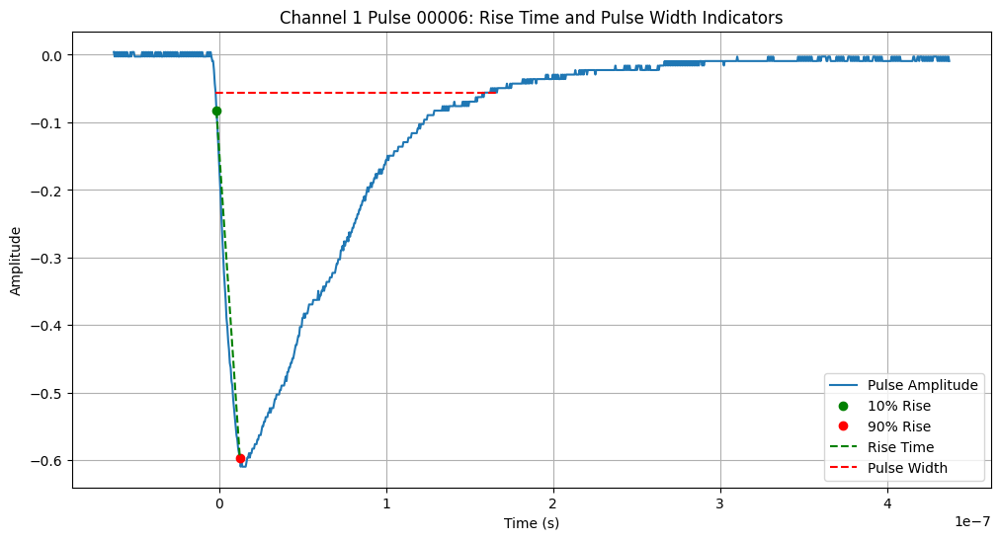

In [12]:


def plot_pulse_with_metrics(df, channel, pulse_id):
    """
    Grafica un pulso con marcas visuales para el tiempo de subida y el ancho del pulso.
    
    Args:
    - df (DataFrame): DataFrame con las columnas 'Time' y 'Amplitude'.
    - channel (str): Canal del pulso.
    - pulse_id (str): Identificador del pulso.
    """
    if df.empty:
        print("No data to plot.")
        return

    # Asumimos que las métricas ya están calculadas
    metrics = pulse_metrics[channel].get(pulse_id, {})

    # Plot del pulso
    plt.figure(figsize=(12, 6))
    plt.plot(df['Time'], df['Amplitude'], label='Pulse Amplitude')

    if metrics:
        # Obtener índices para las métricas usando las funciones ya definidas
        min_idx = df['Amplitude'].idxmin()
        t10_idx, _ = find_time_indices(df['Amplitude'], 0.1, min_idx)
        _, t90_idx = find_time_indices(df['Amplitude'], 0.9, min_idx)
        t50_start_idx, t50_end_idx = find_time_indices(df['Amplitude'], 0.09, len(df))

        if t10_idx is not None and t90_idx is not None:
            # Marcar el 10% y el 90%
            plt.plot(df['Time'].iloc[t10_idx], df['Amplitude'].iloc[t10_idx], 'go', label='10% Rise')
            plt.plot(df['Time'].iloc[t90_idx], df['Amplitude'].iloc[t90_idx], 'ro', label='90% Rise')

            # Línea para el tiempo de subida
            plt.plot([df['Time'].iloc[t10_idx], df['Time'].iloc[t90_idx]], 
                     [df['Amplitude'].iloc[t10_idx], df['Amplitude'].iloc[t90_idx]], 'g--', label='Rise Time')

        if t50_start_idx is not None and t50_end_idx is not None:
            # Línea para el ancho del pulso
            plt.plot([df['Time'].iloc[t50_start_idx], df['Time'].iloc[t50_end_idx]],
                     [df['Amplitude'].iloc[t50_start_idx], df['Amplitude'].iloc[t50_end_idx]], 'r--', label='Pulse Width')

    plt.title(f'Channel {channel} Pulse {pulse_id}: Rise Time and Pulse Width Indicators')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()

# Ejemplo de uso
selected_channel = '1'  # Ajusta esto según tus datos
selected_pulse = '00006'  # Ajusta esto según tus datos
if selected_channel in corrected_data and selected_pulse in corrected_data[selected_channel]:
    df = corrected_data[selected_channel][selected_pulse]
    plot_pulse_with_metrics(df, selected_channel, selected_pulse)
else:
    print(f"No data available for Channel {selected_channel} Pulse {selected_pulse}")




## Cálculo de Métricas Promedio de Pulsos por Canal

Este código calcula el promedio del tiempo de subida y el ancho del pulso para cada canal basado en los datos previamente analizados. Proceso detallado:

- **Función de cálculo**: `calculate_average_metrics` recibe un diccionario que contiene las métricas de cada pulso por canal y devuelve otro diccionario con los promedios por canal.

- **Extracción de métricas**: Extrae listas de tiempos de subida y anchos de pulso de los pulsos que superaron el umbral definido anteriormente.

- **Cálculo de promedios**: Utiliza la función `np.mean` para calcular el promedio de las métricas solo si existen valores válidos, evitando errores en caso de listas vacías.

- **Impresión de resultados**: Muestra los promedios calculados para cada canal, proporcionando una visión clara del comportamiento típico de los pulsos en cada canal.

Este enfoque ofrece una herramienta útil para evaluar el rendimiento general de los canales en términos de características de pulsos, facilitando comparaciones y análisis estadísticos adicionales.


In [13]:


def calculate_average_metrics(pulse_metrics):
    """
    Calcula el promedio del tiempo de subida y el ancho del pulso para cada canal.
    
    Args:
    - pulse_metrics (dict): Diccionario que contiene las métricas de cada pulso por canal.
    
    Returns:
    - Dict: Diccionario con los promedios por canal.
    """
    average_metrics = {}
    for channel, pulses in pulse_metrics.items():
        rise_times = []
        pulse_widths = []
        for metrics in pulses.values():
            if metrics['Tiempo de Subida'] is not None:
                rise_times.append(metrics['Tiempo de Subida'])
            if metrics['Ancho del Pulso'] is not None:
                pulse_widths.append(metrics['Ancho del Pulso'])
        
        # Calcular promedios solo si hay valores disponibles
        avg_rise_time = np.mean(rise_times) if rise_times else None
        avg_pulse_width = np.mean(pulse_widths) if pulse_widths else None
        
        average_metrics[channel] = {
            'Promedio Tiempo de Subida': avg_rise_time,
            'Promedio Ancho del Pulso': avg_pulse_width
        }
    
    return average_metrics

# Ejecutar el cálculo de promedios
average_metrics = calculate_average_metrics(pulse_metrics)

# Imprimir los resultados
for channel, averages in average_metrics.items():
    print(f"Channel {channel}:")
    print(f"Promedio Tiempo de Subida: {averages['Promedio Tiempo de Subida']}")
    print(f"Promedio Ancho del Pulso: {averages['Promedio Ancho del Pulso']}")


Channel 1:
Promedio Tiempo de Subida: 1.6276649746192895e-08
Promedio Ancho del Pulso: 1.7503802281368823e-07
Channel 2:
Promedio Tiempo de Subida: 2.0373015873015873e-08
Promedio Ancho del Pulso: 4.383870541611625e-07
Channel 3:
Promedio Tiempo de Subida: 2.1803571428571434e-08
Promedio Ancho del Pulso: 3.5028468208092487e-07
Channel 4:
Promedio Tiempo de Subida: 2.0647058823529412e-08
Promedio Ancho del Pulso: 3.916545988258317e-07


# Definicion de ventana de interes, creacion de histograma y pulso promedio 


## Filtrado de Datos por Ventanas de Tiempo y Visualización por Canal

Este código filtra y visualiza datos de pulsos para cada canal dentro de ventanas de tiempo específicas, facilitando la comparación y el análisis de características particulares de los pulsos. Detalles del proceso incluyen:

- **Definición de ventanas de tiempo**: Un diccionario `time_windows` especifica los rangos de tiempo para filtrar los datos en cada canal, permitiendo ajustes personalizados según las necesidades experimentales.

- **Filtrado de datos**: Utiliza las ventanas de tiempo definidas para filtrar los pulsos en cada canal. Los datos que caen dentro de estas ventanas son almacenados en un nuevo diccionario `window_data`.

- **Configuración de la visualización**: Prepara una figura con subplots para cada canal, ajustando el tamaño según el número de canales disponibles.

- **Trazado de los datos filtrados**: Itera sobre cada canal y sus pulsos filtrados, graficando la amplitud en función del tiempo en el subplot correspondiente.

- **Personalización de los subplots**: Configura títulos y etiquetas para cada subplot, mejorando la claridad y comprensión de los datos presentados.

Este enfoque no solo facilita la observación directa de las variaciones temporales de los pulsos dentro de rangos específicos, sino que también mejora la comparación entre canales, crucial para análisis detallados en experimentos de múltiples canales.


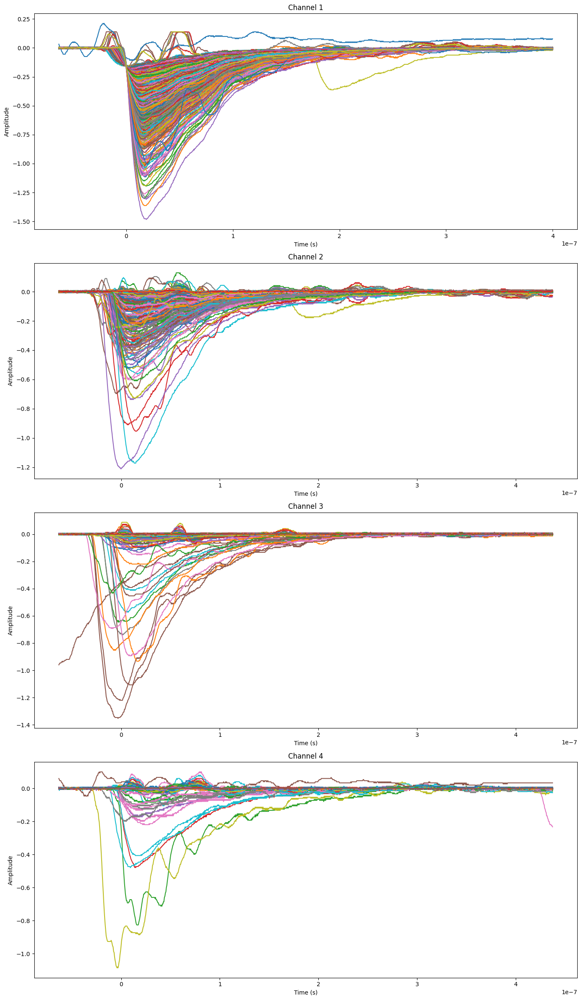

In [14]:
# Diccionario con las ventanas de tiempo para cada canal
time_windows = {
    '1': (-1e-7, 4e-7),  # Ventana para el canal 1
    '2': (-2e-7, 10e-7),
    "3": (-2e-7, 10e-7),
    "4": (-2e-7, 10e-7)## Ventana para el canal 2, puede cambiar según necesidades futuras
}

# Diccionario para almacenar los datos filtrados
window_data = {}

for channel, pulses in corrected_data.items():
    if channel in time_windows:  # Asegurar que el canal tiene una ventana de tiempo definida
        start_time, end_time = time_windows[channel]
        window_data[channel] = {}
        for pulse_id, df in pulses.items():
            # Filtrar los datos dentro de la ventana de tiempo específica para cada canal
            filtered_df = df[(df['Time'] >= start_time) & (df['Time'] <= end_time)]
            window_data[channel][pulse_id] = filtered_df

# Determinar el número de canales y configurar la figura
num_channels = len(window_data)
fig, axes = plt.subplots(nrows=num_channels, ncols=1, figsize=(14, 6 * num_channels), squeeze=False)

# Iterar sobre cada canal y su correspondiente eje
for ax, (channel, pulses) in zip(axes.flatten(), window_data.items()):
    for pulse_id, df in pulses.items():
        # Trazar los datos en el eje correspondiente
        ax.plot(df['Time'], df['Amplitude'])
    # Configurar las etiquetas y título del subgráfico
    ax.set_title(f'Channel {channel}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Amplitude')
   

plt.tight_layout()
plt.show()

## Análisis Histograma de Áreas Bajo la Curva por Canal

Este código calcula y visualiza el histograma de las áreas bajo la curva para los pulsos de cada canal dentro de ventanas de tiempo especificadas. Detalles del proceso incluyen:

- **Cálculo del área bajo la curva**: Para cada pulso en cada canal, se utiliza el método del trapecio (`np.trapz`) para calcular el área bajo la curva de la amplitud versus el tiempo, almacenando estos valores en un diccionario `area_under_curve`.

- **Preparación de la visualización**: Configura una figura con subplots para cada canal, ajustando su tamaño en función del número de canales. Cada histograma representa la distribución de las áreas bajo la curva calculadas.

- **Trazado de histogramas**: Itera sobre los canales, trazando un histograma para cada uno con 100 bins para visualizar la distribución de áreas. Los histogramas están etiquetados con información del canal correspondiente.

- **Configuración de los subplots**: Se personaliza cada subplot con títulos, etiquetas para los ejes, y una leyenda que identifica el canal. Se emplea un formato de grilla detallado para mejorar la claridad visual del histograma.

Este enfoque proporciona una herramienta útil para evaluar la distribución de las áreas bajo la curva de los pulsos, lo que puede indicar características como la energía o la intensidad de los eventos registrados en cada canal.


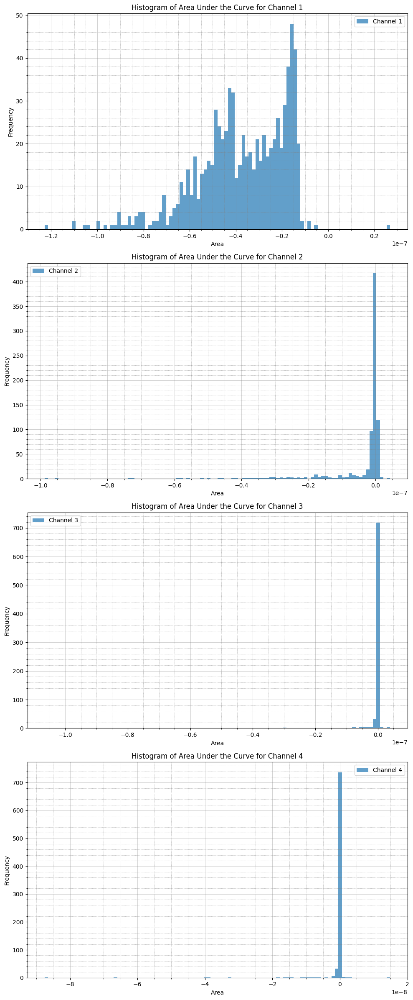

In [15]:

import matplotlib.ticker as ticker


# Diccionario para almacenar las áreas bajo la curva de cada pulso
area_under_curve = {}

for channel, pulses in window_data.items():
    area_under_curve[channel] = []
    for pulse_id, df in pulses.items():
        # Calcular el área usando el método del trapecio
        area = np.trapz(df['Amplitude'], df['Time'])
        area_under_curve[channel].append(area)

# Configurar la figura para el histograma
num_channels = len(area_under_curve)
fig, axes = plt.subplots(nrows=num_channels, ncols=1, figsize=(10, 6 * num_channels), squeeze=False)

# Asegurarse de que axes es iterable (importante si hay solo un canal)
if num_channels == 1:
    axes = [axes]

# Iterar sobre cada canal y su correspondiente eje
for ax, (channel, areas) in zip(axes.flatten(), area_under_curve.items()):
    ax.hist(areas, bins=100, alpha=0.7, label=f'Channel {channel}')
    ax.set_title(f'Histogram of Area Under the Curve for Channel {channel}')
    ax.set_xlabel('Area')
    ax.set_ylabel('Frequency')
    ax.legend()

    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.grid(True, which='major', linestyle='-', linewidth=0.5, color='gray', alpha=0.5)
    ax.grid(True, which='minor', linestyle=':', linewidth=0.5, color='gray', alpha=1)

# Ajustar el espaciado entre los subgráficos para evitar la superposición de etiquetas y títulos
plt.tight_layout()
plt.show()

## Histograma de Amplitudes Máximas por Canal

Este código calcula y visualiza un histograma de las amplitudes máximas (mínimos en valor absoluto debido a amplitudes negativas) para pulsos dentro de ventanas de tiempo especificadas por canal.

- **Extracción de amplitudes máximas**: Itera sobre los pulsos de cada canal en `window_data`, extrayendo la amplitud máxima (el mínimo valor de amplitud, en este caso) de cada pulso y almacenando estos valores en un diccionario `max_amplitudes`.




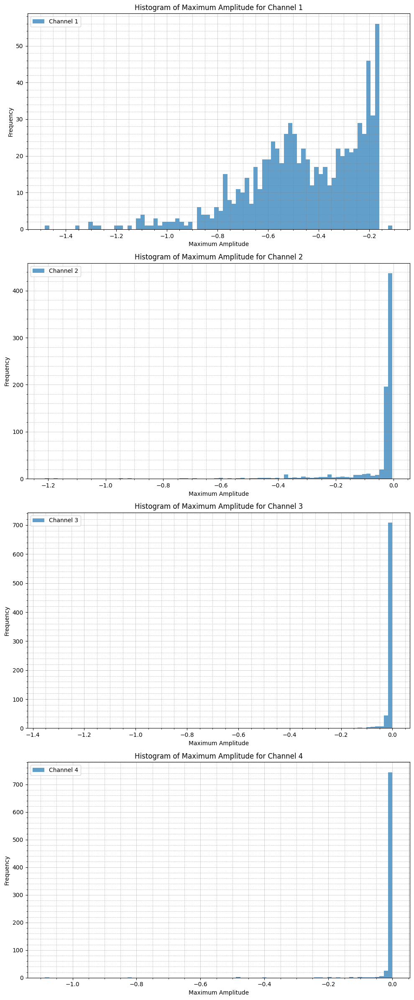

In [16]:


# Diccionario para almacenar las amplitudes máximas de cada pulso
max_amplitudes = {}

for channel, pulses in window_data.items():
    max_amplitudes[channel] = []
    for pulse_id, df in pulses.items():
        # Extraer la amplitud máxima de cada pulso
        max_amplitude = df['Amplitude'].min()
        max_amplitudes[channel].append(max_amplitude)

# Configurar la figura para el histograma
num_channels = len(max_amplitudes)
fig, axes = plt.subplots(nrows=num_channels, ncols=1, figsize=(10, 6 * num_channels), squeeze=False)

# Asegurarse de que axes es iterable (importante si hay solo un canal)
if num_channels == 1:
    axes = [axes]

# Iterar sobre cada canal y su correspondiente eje
for ax, (channel, amplitudes) in zip(axes.flatten(), max_amplitudes.items()):
    ax.hist(amplitudes, bins=80, alpha=0.7, label=f'Channel {channel}')
    ax.set_title(f'Histogram of Maximum Amplitude for Channel {channel}')
    ax.set_xlabel('Maximum Amplitude')
    ax.set_ylabel('Frequency')
    ax.legend()
     
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.grid(True, which='major', linestyle='-', linewidth=0.5, color='gray', alpha=0.5)
    ax.grid(True, which='minor', linestyle=':', linewidth=0.5, color='gray', alpha=1)

# Ajustar el espaciado entre los subgráficos para evitar la superposición de etiquetas y títulos
plt.tight_layout()
plt.show()

## Análisis de Amplitud Promedio de Pulsos por Canal

Este código agrupa y visualiza la amplitud promedio de pulsos corregidos por canal, proporcionando una representación gráfica clara de la actividad promedio en cada canal. Los detalles del proceso son los siguientes:


- **Acumulación y promedio de datos**: Itera sobre los pulsos en cada canal, acumulando las amplitudes y contando el número de pulsos en cada punto de tiempo. Luego calcula la amplitud promedio por tiempo y la amplitud promedio total para cada canal.

- **Trazado de datos promedio**: Grafica la amplitud promedio a lo largo del tiempo en cada subplot, facilitando la comparación visual entre canales.

- **Amplitud Promedio**: Incluye un texto adicional que muestra la amplitud promedio total en cada gráfico, mejorando la interpretación de los datos.


Este enfoque provee una herramienta útil para analizar y visualizar la consistencia y variabilidad de la actividad de pulsos entre diferentes canales, permitiendo una evaluación detallada de las características del señal promedio en estudios experimentales.


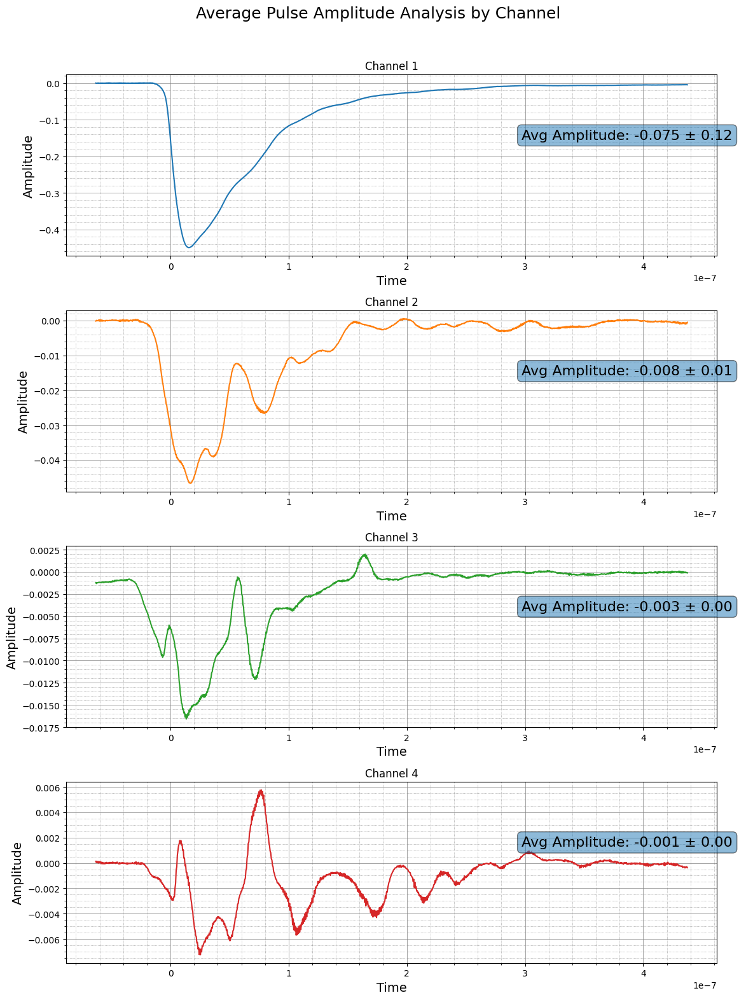

{'1': {'average_amplitude': -0.07527342715099711,
  'error': 0.11965931171948245,
  'pulses': {'00256':               Time  Amplitude
   0    -6.317200e-08  -0.002000
   1    -6.267200e-08  -0.002000
   2    -6.217200e-08  -0.002000
   3    -6.167200e-08   0.004667
   4    -6.117200e-08  -0.002000
   ...            ...        ...
   997   4.353280e-07  -0.002000
   998   4.358280e-07  -0.002000
   999   4.363280e-07  -0.002000
   1000  4.368280e-07  -0.002000
   1001  4.373280e-07  -0.002000
   
   [1002 rows x 2 columns],
   '00628':               Time  Amplitude
   0    -6.317200e-08  -0.003167
   1    -6.267200e-08  -0.003167
   2    -6.217200e-08   0.003500
   3    -6.167200e-08  -0.003167
   4    -6.117200e-08  -0.003167
   ...            ...        ...
   997   4.353280e-07   0.003500
   998   4.358280e-07  -0.003167
   999   4.363280e-07   0.003500
   1000  4.368280e-07  -0.003167
   1001  4.373280e-07   0.003500
   
   [1002 rows x 2 columns],
   '00023':               Time  Am

In [48]:

# Definir una lista de colores
colors = plt.cm.tab10.colors  # Utilizar la paleta tab10 de Matplotlib que tiene 10 colores diferentes

# Diccionario para almacenar los resultados
results = {}

# Determinar cuántos canales únicos hay para configurar los subplots
num_channels = len(corrected_data.keys())
fig, axs = plt.subplots(num_channels, 1, figsize=(12, 4 * num_channels))

# Asegurarse de que axs sea iterable (en caso de que haya solo un canal)
if num_channels == 1:
    axs = [axs]

# Iterar sobre cada canal en los datos corregidos
for idx, (ax, (channel, pulses)) in enumerate(zip(axs, corrected_data.items())):
    # Seleccionar el color para el canal actual
    color = colors[idx % len(colors)]

    # Crear un DataFrame vacío para acumular los datos
    df_accumulated = pd.DataFrame()
    
    # Almacenar datos individuales de pulsos
    pulses_data = {}

    # Iterar sobre cada pulso en el canal
    for pulse_id, df in pulses.items():
        # Guardar datos del pulso en el diccionario
        pulses_data[pulse_id] = df.copy()

        # Verificar si df_accumulated está vacío; de ser así, inicializarlo
        if df_accumulated.empty:
            df_accumulated = df.copy()
            df_accumulated['Count'] = 1
        else:
            # Realizar la unión de los datos por el tiempo, sumando las amplitudes donde coincidan los tiempos
            df = df.set_index('Time')
            df_accumulated = df_accumulated.set_index('Time')
            df_accumulated = df_accumulated.add(df, fill_value=0)
            df_accumulated['Count'] = df_accumulated['Count'].fillna(0) + 1
            df_accumulated.reset_index(inplace=True)

    # Calcular el promedio de las amplitudes en cada punto de tiempo
    df_accumulated['Amplitude'] /= df_accumulated['Count']

    # Calcular la amplitud promedio total y su error (desviación estándar) para el canal
    total_average_amplitude = df_accumulated['Amplitude'].mean()
    amplitude_error = df_accumulated['Amplitude'].std()

    # Guardar los resultados en el diccionario, incluyendo datos de cada pulso
    results[channel] = {
        'average_amplitude': total_average_amplitude,
        'error': amplitude_error,
        'pulses': pulses_data
    }

    # Trazar los datos promedio
    ax.plot(df_accumulated['Time'], df_accumulated['Amplitude'], color=color)

    # Configurar las etiquetas y títulos del gráfico para cada subplot
    ax.set_title(f'Channel {channel}')
    ax.set_xlabel('Time', fontsize=14)
    ax.set_ylabel('Amplitude', fontsize=14)
    ax.grid(True, which='both', linestyle='-', linewidth='0.5', color='gray')
    ax.minorticks_on()
    ax.grid(which='minor', linestyle=':', linewidth='0.5', color='gray')

    # Añadir texto en el gráfico
    ax.text(0.70, 0.70, f'Avg Amplitude: {total_average_amplitude:.3f} ± {amplitude_error:.2f}',
            transform=ax.transAxes, fontsize=16, verticalalignment='top', bbox=dict(boxstyle="round", alpha=0.5))

# Añadir un título general al gráfico
fig.suptitle('Average Pulse Amplitude Analysis by Channel', fontsize=18)

# Ajustar el layout para evitar superposiciones
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Ajuste del layout para dejar espacio para el título general

# Mostrar el gráfico
plt.show()

# En el entorno Jupyter, los datos se pueden almacenar en una celda para su uso posterior
results  # Esta variable contiene los resultados para cada canal



Los datos de los pulsos se han guardado en el archivo 'pulse_data_results.root'.


# Guardado de datos en ROOT

Guarda los valores promedio totales en root

In [45]:
import uproot
import pandas as pd

# Crear un archivo ROOT y abrirlo para escritura
with uproot.recreate("pulse_data_results.root") as root_file:
    for channel, channel_data in results.items():
        # Crear un grupo para cada canal
        channel_group = f"Channel_{channel}"
        
        # Iterar sobre cada pulso en el canal
        for pulse_id, df in channel_data['pulses'].items():
            # Crear un nombre único para cada pulso
            pulse_name = f"Pulse_{pulse_id}"
            
            # Guardar el DataFrame del pulso en el archivo ROOT
            root_file[f"{channel_group}/{pulse_name}"] = df

print("Los datos de los pulsos se han guardado en el archivo 'TotalAvgresults.root'.")


Los datos de los pulsos se han guardado en el archivo 'pulse_data_results.root'.


Se guargan los pulsos totales ya corregidos pero no en su ventana, para agregar los de la ventana cambiar el diccionario del codgio anterior por window_data

In [46]:
import ROOT

# Crear un archivo ROOT para guardar los gráficos
root_file = ROOT.TFile("pulse_data_results.root", "RECREATE")

# Iterar sobre cada canal en los datos de resultados
for channel, channel_data in results.items():
    # Crear un canvas para el canal
    canvas = ROOT.TCanvas(f"Canvas_Channel_{channel}", f"Channel {channel} Pulses", 1200, 800)
    
    # Iterar sobre cada pulso en el canal
    multi_graph = ROOT.TMultiGraph()
    for pulse_id, df in channel_data['pulses'].items():
        n_points = len(df['Time'])
        graph = ROOT.TGraph(n_points, df['Time'].to_numpy(), df['Amplitude'].to_numpy())
        graph.SetTitle(f"Pulse {pulse_id}")
        multi_graph.Add(graph)
    
    # Dibujar el multigráfico
    multi_graph.SetTitle(f"Channel {channel} Pulses;Time;Amplitude")
    multi_graph.Draw("AL")
    
    # Guardar el canvas en el archivo ROOT
    canvas.Write()

# Cerrar el archivo ROOT
root_file.Close()

print("Los gráficos se han guardado en el archivo 'pulse_data_results.root'.")


Welcome to JupyROOT 6.29/01
Los gráficos se han guardado en el archivo 'pulse_data_results.root'.


- Se guardan los datos de los valores promedio la amplitud entre cada punto de cada canal y se muestra para formar un solo pulso


In [47]:
import ROOT


# Crear un archivo ROOT para guardar los gráficos
root_file = ROOT.TFile("average_amplitude_results.root", "RECREATE")

# Iterar sobre cada canal en los datos de resultados
for channel, channel_data in results.items():
    # Crear un canvas para el canal
    canvas = ROOT.TCanvas(f"Canvas_Channel_{channel}", f"Channel {channel} Average Pulse", 1200, 800)
    
    # Obtener los datos del pulso promedio
    df_accumulated = pd.DataFrame()
    
    # Iterar sobre cada pulso en el canal para calcular el promedio
    for pulse_id, df in channel_data['pulses'].items():
        if df_accumulated.empty:
            df_accumulated = df.copy()
            df_accumulated['Count'] = 1
        else:
            df = df.set_index('Time')
            df_accumulated = df_accumulated.set_index('Time')
            df_accumulated = df_accumulated.add(df, fill_value=0)
            df_accumulated['Count'] = df_accumulated['Count'].fillna(0) + 1
            df_accumulated.reset_index(inplace=True)
    
    # Calcular el promedio de las amplitudes en cada punto de tiempo
    df_accumulated['Amplitude'] /= df_accumulated['Count']

    # Crear un gráfico de línea para el promedio de amplitud
    n_points = len(df_accumulated['Time'])
    avg_graph = ROOT.TGraph(n_points, df_accumulated['Time'].to_numpy(), df_accumulated['Amplitude'].to_numpy())
    avg_graph.SetTitle(f"Channel {channel} Average Pulse;Time;Amplitude")
    avg_graph.SetLineColor(ROOT.kBlue)
    avg_graph.SetLineWidth(2)
    
    # Dibujar el gráfico en el canvas
    avg_graph.Draw("AL")
    
    # Guardar el canvas en el archivo ROOT
    canvas.Write()

# Cerrar el archivo ROOT
root_file.Close()

print("Los gráficos de amplitud promedio se han guardado en el archivo 'average_amplitude_results.root'.")


Los gráficos de amplitud promedio se han guardado en el archivo 'average_amplitude_results.root'.
